In [1]:
from __future__ import print_function
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import keras
from keras.preprocessing.image import ImageDataGenerator, load_img

Using TensorFlow backend.


In [2]:
train_dir = './v2_data/train'
validation_dir = './v2_data/validation'
image_size = 224

## Experiment 2 : Train Last 4 layers without data augmentation

In [3]:
from keras.applications import VGG16

#Load the VGG model
vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

# Freeze all the layers
for layer in vgg_conv.layers[:-4]:
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in vgg_conv.layers:
    print(layer, layer.trainable)


from keras import models
from keras import layers
from keras import optimizers

# Create the model
model = models.Sequential()

# Add the vgg convolutional base model
model.add(vgg_conv)

# Add new layers
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(5, activation='softmax'))

# Show a summary of the model. Check the number of trainable parameters
model.summary()

<keras.engine.input_layer.InputLayer object at 0x10b8c2c50> False
<keras.layers.convolutional.Conv2D object at 0x14b951dd0> False
<keras.layers.convolutional.Conv2D object at 0x10b8d4190> False
<keras.layers.pooling.MaxPooling2D object at 0x14b96af50> False
<keras.layers.convolutional.Conv2D object at 0x14b99a750> False
<keras.layers.convolutional.Conv2D object at 0x14b9c25d0> False
<keras.layers.pooling.MaxPooling2D object at 0x14b9c9e10> False
<keras.layers.convolutional.Conv2D object at 0x14b9c9b90> False
<keras.layers.convolutional.Conv2D object at 0x14b9cce90> False
<keras.layers.convolutional.Conv2D object at 0x14b9d5b10> False
<keras.layers.pooling.MaxPooling2D object at 0x14b9d5f10> False
<keras.layers.convolutional.Conv2D object at 0x14b9d9b50> False
<keras.layers.convolutional.Conv2D object at 0x14b9dd950> False
<keras.layers.convolutional.Conv2D object at 0x14badbc90> False
<keras.layers.pooling.MaxPooling2D object at 0x14bae4d10> False
<keras.layers.convolutional.Conv2D obj

Found 1702 images belonging to 5 classes.
Found 418 images belonging to 5 classes.
Epoch 1/20
18/17 [===============================] - 168s 9s/step - loss: 1.6987 - acc: 0.4818 - val_loss: 0.0495 - val_acc: 0.7416
Epoch 2/20
18/17 [===============================] - 169s 9s/step - loss: 0.3190 - acc: 0.8895 - val_loss: 0.0146 - val_acc: 0.7751
Epoch 3/20
18/17 [===============================] - 163s 9s/step - loss: 0.1494 - acc: 0.9518 - val_loss: 0.0040 - val_acc: 0.7847
Epoch 4/20
18/17 [===============================] - 161s 9s/step - loss: 0.0441 - acc: 0.9882 - val_loss: 2.9886e-04 - val_acc: 0.7440
Epoch 5/20
18/17 [===============================] - 162s 9s/step - loss: 0.1807 - acc: 0.9642 - val_loss: 8.4858e-05 - val_acc: 0.7990
Epoch 6/20
18/17 [===============================] - 169s 9s/step - loss: 0.0333 - acc: 0.9894 - val_loss: 0.9333 - val_acc: 0.6364
Epoch 7/20
18/17 [===============================] - 169s 9s/step - loss: 0.0289 - acc: 0.9888 - val_loss: 2.7734e-04

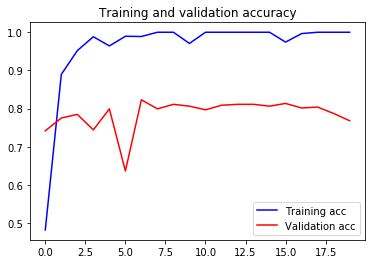

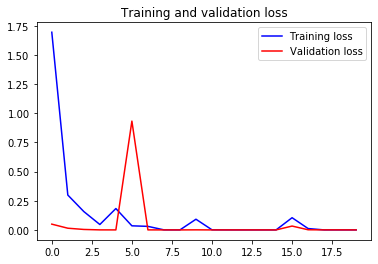

In [4]:
# No Data augmentation 
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

# Change the batchsize according to your system RAM
train_batchsize = 100
val_batchsize = 10

# Data Generator for Training data
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical')

# Data Generator for Validation data
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# Train the Model
history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size ,
      epochs=20,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)

# Save the Model
model.save('v2_last4_layers.h5')

# Plot the accuracy and loss curves
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [5]:
labels = (train_generator.class_indices)
print(labels)

{'block': 0, 'hook': 1, 'jab': 2, 'none': 3, 'slip': 4}


Found 418 images belonging to 5 classes.
42/41 [==============================] - 33s 782ms/step
No of errors = 97/418


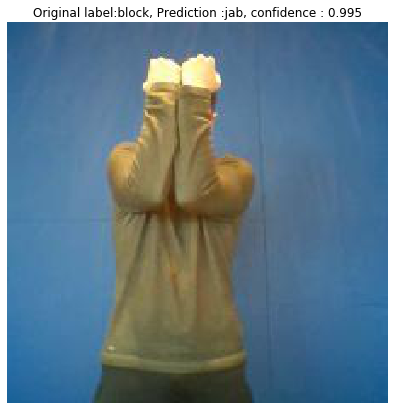

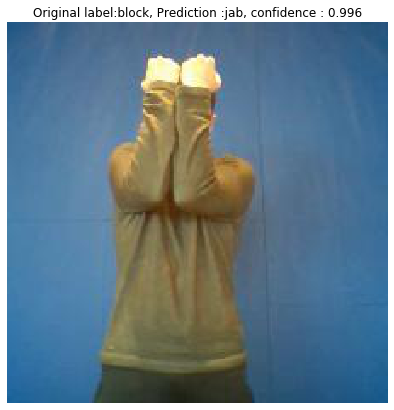

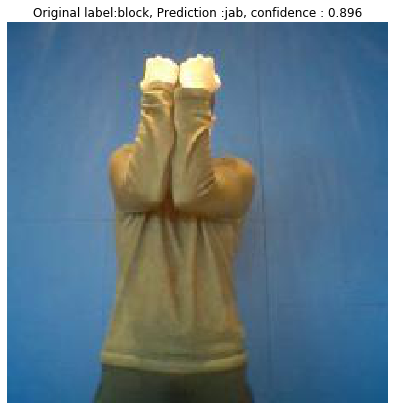

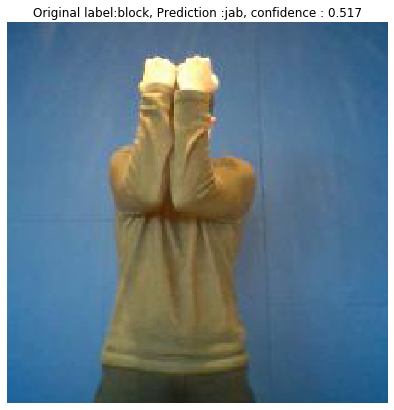

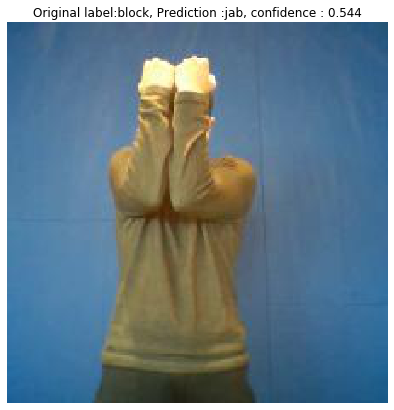

...

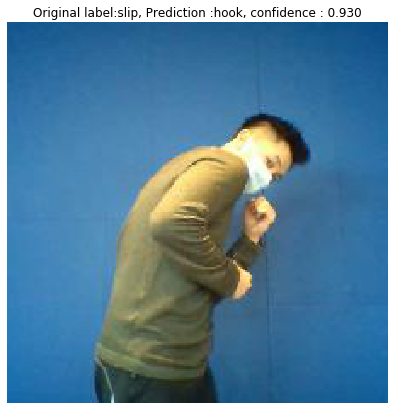

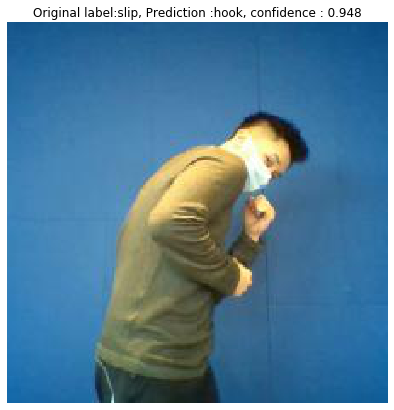

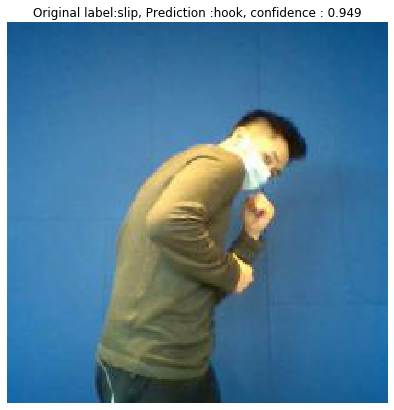

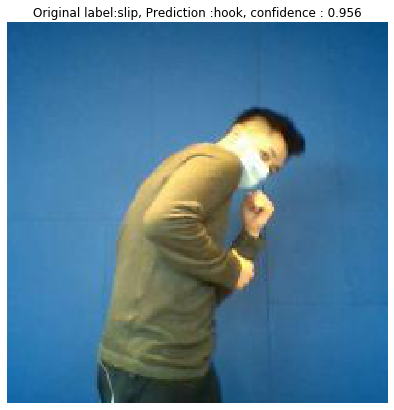

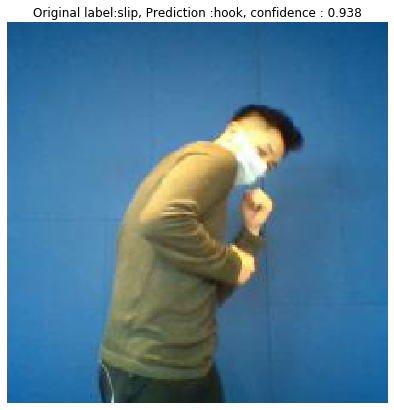

In [6]:
# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Get the filenames from the generator
fnames = validation_generator.filenames

# Get the ground truth from generator
ground_truth = validation_generator.classes

# Get the label to class mapping from the generator
label2index = validation_generator.class_indices

# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)

errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))

# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
    
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
    
    original = load_img('{}/{}'.format(validation_dir,fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()

## Experiment 3 : Train last 4 layers with data augmentation

In [7]:
from keras.applications import VGG16

#Load the VGG model
vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

# Freeze all the layers
for layer in vgg_conv.layers[:-4]:
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in vgg_conv.layers:
    print(layer, layer.trainable)


from keras import models
from keras import layers
from keras import optimizers

# Create the model
model = models.Sequential()

# Add the vgg convolutional base model
model.add(vgg_conv)

# Add new layers
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(5, activation='softmax'))

# Show a summary of the model. Check the number of trainable parameters
model.summary()

<keras.engine.input_layer.InputLayer object at 0x14bb9b890> False
<keras.layers.convolutional.Conv2D object at 0x14d2ef650> False
<keras.layers.convolutional.Conv2D object at 0x14f05afd0> False
<keras.layers.pooling.MaxPooling2D object at 0x14f05af10> False
<keras.layers.convolutional.Conv2D object at 0x14f05a810> False
<keras.layers.convolutional.Conv2D object at 0x14f067390> False
<keras.layers.pooling.MaxPooling2D object at 0x14f7bab50> False
<keras.layers.convolutional.Conv2D object at 0x14f7bab90> False
<keras.layers.convolutional.Conv2D object at 0x14f2fca90> False
<keras.layers.convolutional.Conv2D object at 0x14ee3d710> False
<keras.layers.pooling.MaxPooling2D object at 0x14ee3dd10> False
<keras.layers.convolutional.Conv2D object at 0x14f2fe590> False
<keras.layers.convolutional.Conv2D object at 0x14f63c850> False
<keras.layers.convolutional.Conv2D object at 0x14f3c98d0> False
<keras.layers.pooling.MaxPooling2D object at 0x14f6b15d0> False
<keras.layers.convolutional.Conv2D obj

Found 1702 images belonging to 5 classes.
Found 418 images belonging to 5 classes.
Epoch 1/40
69/68 [==============================] - 327s 5s/step - loss: 0.7493 - acc: 0.7179 - val_loss: 0.0387 - val_acc: 0.7990
Epoch 2/40
69/68 [==============================] - 318s 5s/step - loss: 0.1951 - acc: 0.9362 - val_loss: 0.0010 - val_acc: 0.7847
Epoch 3/40
69/68 [==============================] - 301s 4s/step - loss: 0.0981 - acc: 0.9660 - val_loss: 1.5076e-04 - val_acc: 0.8134
Epoch 4/40
69/68 [==============================] - 306s 4s/step - loss: 0.0503 - acc: 0.9842 - val_loss: 1.6456 - val_acc: 0.6292
Epoch 5/40
69/68 [==============================] - 310s 4s/step - loss: 0.0440 - acc: 0.9908 - val_loss: 2.0862e-07 - val_acc: 0.7632
Epoch 6/40
69/68 [==============================] - 310s 4s/step - loss: 0.0329 - acc: 0.9881 - val_loss: 4.9174e-07 - val_acc: 0.7751
Epoch 7/40
69/68 [==============================] - 310s 4s/step - loss: 0.0562 - acc: 0.9911 - val_loss: 0.0201 - val_

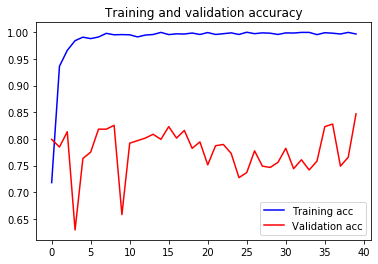

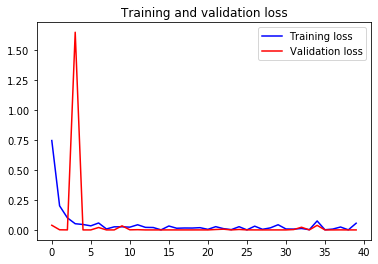

In [8]:
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=10,
      width_shift_range=0.1,
      height_shift_range=0.1,
      horizontal_flip=True,
      fill_mode='nearest')

###train_datagen = ImageDataGenerator(
###      rescale=1./255,
###      rotation_range=20,
###      width_shift_range=0.2,
###      height_shift_range=0.2,
###      horizontal_flip=True,
###      fill_mode='nearest')

validation_datagen = ImageDataGenerator(rescale=1./255)

# Change the batchsize according to your system RAM
train_batchsize = 50
val_batchsize = 10

# Data Generator for Training data
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical')

# Data Generator for Validation data
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# Train the Model
# NOTE that we have multiplied the steps_per_epoch by 2. This is because we are using data augmentation.
history = model.fit_generator(
      train_generator,
      steps_per_epoch=2*train_generator.samples/train_generator.batch_size ,
      epochs=40,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)

# Save the Model
model.save('v2_da_last4_layers.h5')

# Plot the accuracy and loss curves
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Found 418 images belonging to 5 classes.
42/41 [==============================] - 30s 704ms/step
No of errors = 64/418


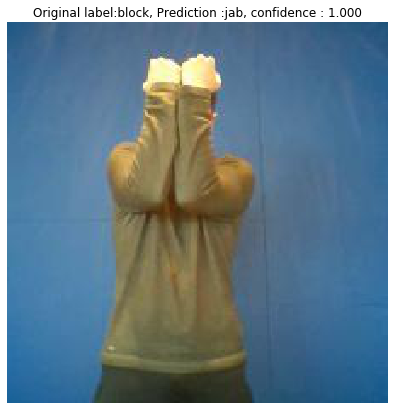

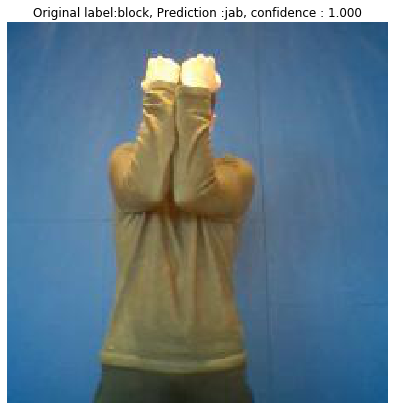

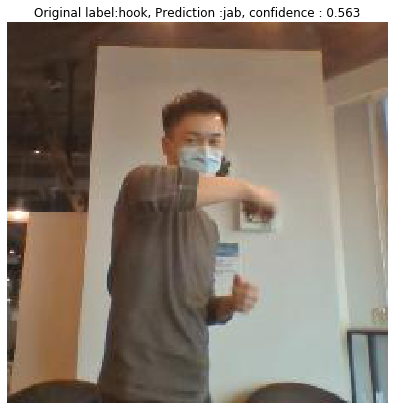

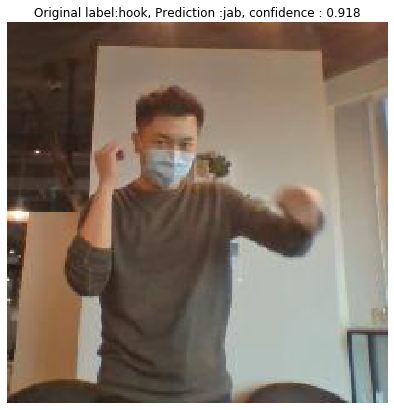

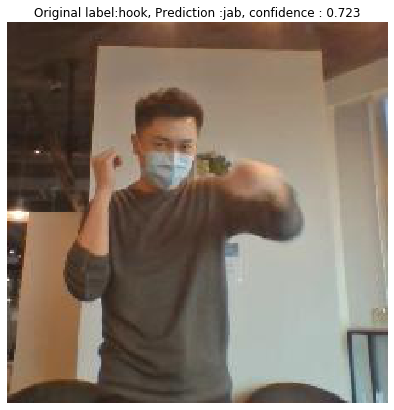

...

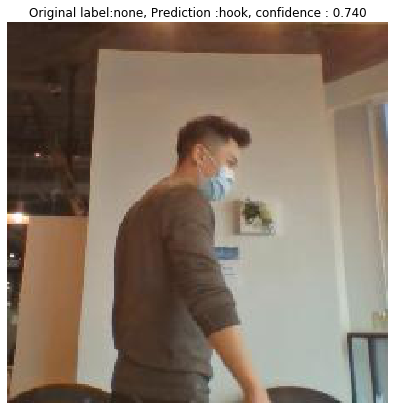

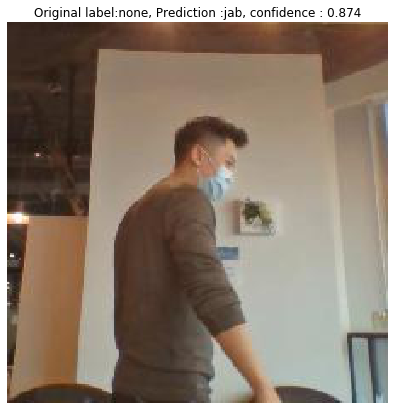

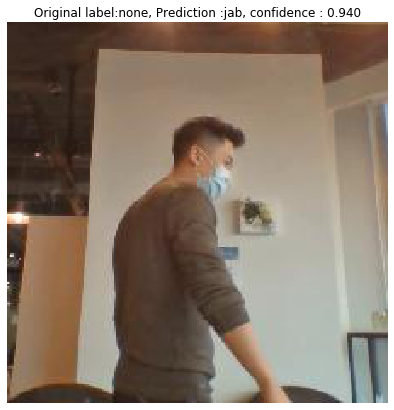

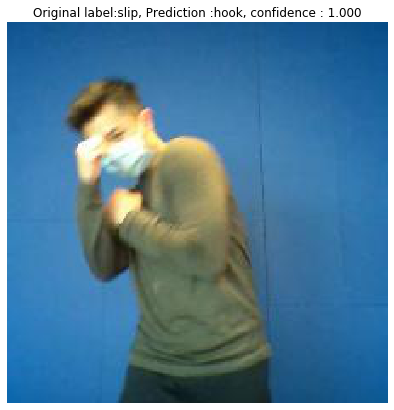

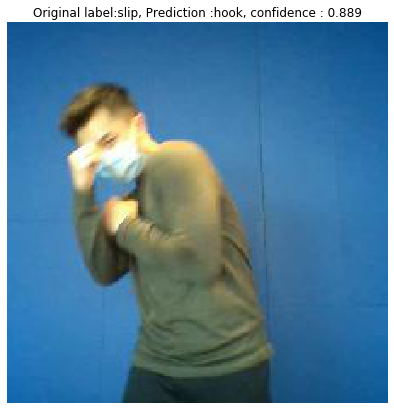

In [9]:
# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Get the filenames from the generator
fnames = validation_generator.filenames

# Get the ground truth from generator
ground_truth = validation_generator.classes

# Get the label to class mapping from the generator
label2index = validation_generator.class_indices

# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)

errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))

# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
    
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
    
    original = load_img('{}/{}'.format(validation_dir,fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()